## NOTEBOOK D: Examining Cropland and Oil Wells and Relationship to Select Health Outcomes in Kern County

This notebook explores cropland and the major crops cultivated in the County, begins exploring the relationship between cropland and oil and gas wells in the County, and the relationship between health outcomes and oil well locations in the County. It will also begin exploring how waterways and water infrastructure are distributed in the County to help explain some of the counterintuitive results, we're seeing between health and oil well locations (that worse health outcomes seem to be concentrated in areas in the east and north even though oil wells and croplands are concentrated in the west).

Kern County has major water projects and other infrastructure, like canals, running through the west side where all the oil and agriculture operations are concentrated, so I'll also begin exploring water infrastructure in the County. It seems that knowing more about the region's watersheds and water infrastructure and how they move water (and possibly the waste from oil and agriculture activities with it) throughout the County.

In [1]:
## importing libraries

# reading data
import pandas as pd
import geopandas as gpd
import numpy as np
import fiona
import osmnx as ox

# plots/charts
import seaborn
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
    # pio.templates.default = "ggplot2"
    # options: seaborn, simple_white, plotly, plotly_white, plotly_dark
    # presentation, xgridoff, ygridoff, gridon, none

# maps
import contextily as ctx
import folium

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


I first start by exploring cropland data, what's grown in the county. I'll then overlay oil well data onto crop type to get a sense of where the most water intensive crops (nuts, citrus, and grapes) are located relative to well locations to get a better sense of their vulnerability/risk of contamination from oil and gas wells.

In [20]:
## loading cropland data
crops = gpd.read_file('kern2022.zip')

In [21]:
## list of columns
crops.columns.to_list()

['DT_ACT',
 'P_STATUS',
 'PERMIT',
 'SITEID',
 'S_STATUS',
 'DT_INACT',
 'PMT_SITE',
 'OP_ACT',
 'OP_INACT',
 'PERMITTEE',
 'MAILING',
 'STATE',
 'TOWNSHIP',
 'RANGE',
 'PMT_YEAR',
 'COMM',
 'ACRES',
 'SECTION',
 'CITY',
 'AGENT',
 'ZIP',
 'geometry']

After reviewing the data, the columns I want to keep include PERMITTEE (Who owns the crop parcel), COMM (what the crop is), ACRES, CITY, and geometry.

In [22]:
## trimming data for desired columns
crops = crops[['PERMITTEE', 'COMM','ACRES','CITY','geometry']]
crops.sample()

,PERMITTEE,COMM,ACRES,CITY,geometry
8422,GRIMMWAY ENTERPRISES,FORAGE HAY/SLGE,79.3,BAKERSFIELD,"POLYGON ((6202976.535 2374275.475, 6203835.179..."


In [23]:
## renaming columns
crops.columns = ['Owner', 'Crop','Acres','City','geometry']
crops.sample()

,Owner,Crop,Acres,City,geometry
7279,GIUMARRA VINEYARDS & FARMS,UNCULTIVATED AG,39.0,BAKERSFIELD,"POLYGON ((6292231.467 2300542.699, 6293138.104..."


In [24]:
## exploring crops grown in the county
crops['Crop'].value_counts()

ALMOND             2636
PISTACHIO          1502
GRAPE              1216
UNCULTIVATED AG     969
ORANGE              673
                   ... 
STRAWBERRY            1
RAPE                  1
OT-PALM               1
MELON-ORGANIC         1
CORN, GRAIN           1
Name: Crop, Length: 183, dtype: int64

In [25]:
## turning "Crop" data into table by type
crop_counts = crops.value_counts(['Crop']).reset_index(name="Count")
crop_counts

,Crop,Count
0,ALMOND,2636
1,PISTACHIO,1502
2,GRAPE,1216
3,UNCULTIVATED AG,969
4,ORANGE,673
...,...,...
178,PUMPKIN,1
179,RADISH-ORGANIC,1
180,RAPE,1
181,RAPE (LEAFY VEG,1


What are the 10 most commonly grown indivdual crops in the County?

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'ALMOND'),
  Text(1, 0, 'PISTACHIO'),
  Text(2, 0, 'GRAPE'),
  Text(3, 0, 'UNCULTIVATED AG'),
  Text(4, 0, 'ORANGE'),
  Text(5, 0, 'WHEAT FOR/FOD'),
  Text(6, 0, 'ALFALFA'),
  Text(7, 0, 'TANGERINE/SDLS'),
  Text(8, 0, 'CORN FOR/FOD'),
  Text(9, 0, 'CARROT')])

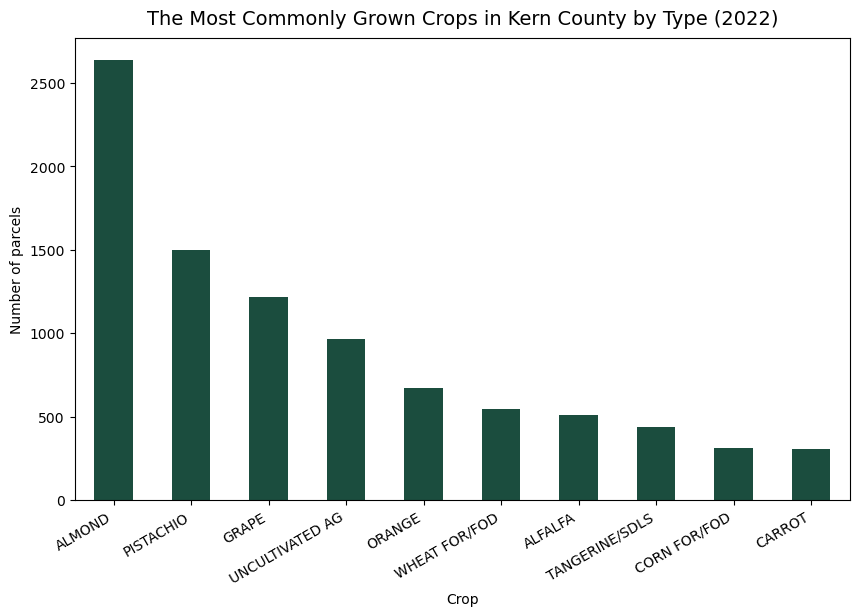

In [26]:
## plotting crops
fig, ax = plt.subplots(figsize=(10,6))

crop_counts[:10].plot.bar(ax=ax,
                                      x='Crop',
                                      y='Count',
                                      legend=False,
                                      color='#1b4d3e'
                                      )
ax.set_xlabel('Crop')
ax.set_ylabel('Number of parcels')
ax.set_title("The Most Commonly Grown Crops in Kern County by Type (2022)",fontsize=14,pad=10)
plt.xticks(rotation=30, ha='right')
# plt.savefig("KernCommonCropsbyType.jpg")

It looks like Kern County is a grower of mostly nuts, grapes, citrus, and grains. I tried searching for what "uncultivated ag" referred to, but still have no found a clear answer. 

There are currently 182 different crop types, which makes knowing what's what on a map difficult. I'd like to create a "Crop Type" variable to sort crops in and make it easier to see what's being grown where exactly in Kern County. First I have to create a dictionary sorting crop by type, which I'll need to convert into a dataframe and merge to the existing crop geodataframe.

In [27]:
## creating nested dictionary: sorting 183 crops into crop types
croptype = {'Nut': ['ALMOND','PISTACHIO', 'ALMOND-ORGANIC','WALNUT','PISTACHIO-ORGANIC','PECAN'],
              'Fruit': ['STRAWBERRY','BLACKBERRY','MELON-ORGANIC','MANGO','APRICOT-ORGANIC','NECTARINE-ORGANIC','APPLE-ORGANIC','TANGELO-ORGANIC','GRAPE','ORANGE','TANGERINE/SDLS','GRAPE, WINE','LEMON','GRAPE-ORGANIC','CHERRY','TANGERINE','POMEGRANATE','GRAPE, RAISIN','GRAPEFRUIT','WATERMELON','ORANGE-ORGANIC','OLIVE','PEACH','TANGERINE-ORGANIC','APPLE','PERSIMMON','BLUEBERRY','TANGELO','NECTARINE','WATERMELON-ORGANIC','BLUEBERRY-ORGANIC','PLUM','GRAPE, WINE-ORGANIC','LIME','SQUASH','HONEYDEW MELON','APRICOT','GRAPEFRUIT-ORGANIC','CHERRY-ORGANIC','LEMON-ORGANIC','MUSK MELON','POMEGRANATE-ORGANIC','BLACKBERRY-ORGANIC','PEPPER SPICE','STRAWBERRY-ORGANIC','SQUASH, SUMMER','CANTALOUPE','GOOSEBERRY','PLUM-ORGANIC','JUJUBE','PEAR','PEACH-ORGANIC','GUAVA','PUMPKIN','SQUASH, WINTER-ORGANIC','AVOCADO','TOMATO-ORGANIC','PERSIMMON-ORGANIC','BITTER MELON','TOMATO SEED','GOURD','OLIVE-ORGANIC','CUCUMBER','ZUCCHINI'],
              'Vegetable': ['RADISH-ORGANIC','LETTUCE LEAF-ORGANIC','SWISS CHARD-ORGANIC','CUCUMBER-ORGANIC','PARSLEY-ORGANIC','CABBAGE-ORGANIC','FENNEL-ORGANIC','ONION SEED','CARROT','POTATO','TOMATO PROCESS','TOMATO','GARLIC','ONION DRY ETC','SWEET POTATO','POTATO-ORGANIC','BOK CHOY LSE LF','CABBAGE','SPINACH','BROCCOLI','CILANTRO','CAULIFLOWER','BEET','MUSTARD GREENS','PARSLEY','LETTUCE LEAF','PEPPER FRUITNG','DAIKON','PEAS','CARROT-ORGANIC','TOMATO PROCESS-ORGANIC','LETTUCE HEAD','ONION GREEN','BEAN DRIED','TURNIP','KOHLRABI','RADISH','KALE','MUSTARD','SAFFLOWER','SWISS CHARD','LETTUCE ROMAINE','GARLIC-ORGANIC','GAI LON TGHT HD','LETTUCE LEAF SD','GAI CHOY LSE LF','BEAN SUCCULENT','COLLARD','CELERY','DILL','EGGPLANT','LEEK','ARUGULA','NAPA CBG TGHT H','RUTABAGA','PEPPER FRUITNG-ORGANIC','DANDELION GREEN','FENNEL','CHIVE','BRUSSEL SPROUT','OP-PALM','SWEET BASIL','KALE-ORGANIC','RAPE (LEAFY VEG','CORN, SWEET','CILANTRO-ORGANIC','FAVA BEAN','BROCCOLI SEED','ASPARAGUS','OT-PALM','RAPE'],
              'Grain/Grass': ['CORN, GRAIN','WHEAT FOR/FOD','ALFALFA','CORN FOR/FOD','WHEAT','TRITICALE','OAT FOR/FOD','OAT','SORGHUM FOR/FOD','RYEGRAS FOR/FOD','BARLEY','SORGHUM MILO','INDUSTRIAL HEMP','WHEAT-ORGANIC','BARLEY FOR/FOD','OAT-ORGANIC','ALFALFA-ORGANIC','BERMUDA GRASS'],
              'Other': ['SUNFLOWER-ORGANIC','SOD FARM (TURF)','COTTON','PASTURELAND','OP-ROSE','COTTON PIMA','N-GRNHS PLANT','SUDANGRASS','FORAGE HAY/SLGE','N-OUTDR PLANTS','OT-DEC. TREE','OP-FLWRNG PLANT','OP-VINE','TURF/SOD','OP-DEC. TREE','RANGELAND','GT-DEC. TREE','CANNABIS (ALL OR UNSPECIFIED)','GP-FLWRNG PLANT','OF-BULB','OP-CHRSTMS TREE','GP-ROSE','UNCULTIVATED AG','UNCULTIVATED AG - ORGANIC'],}

In [28]:
## converting dictionary into a df
croptypedf = pd.DataFrame({'Group':croptype.keys(),'Crop':croptype.values()})
croptypedf

,Group,Crop
0,Nut,"[ALMOND, PISTACHIO, ALMOND-ORGANIC, WALNUT, PI..."
1,Fruit,"[STRAWBERRY, BLACKBERRY, MELON-ORGANIC, MANGO,..."
2,Vegetable,"[RADISH-ORGANIC, LETTUCE LEAF-ORGANIC, SWISS C..."
3,Grain/Grass,"[CORN, GRAIN, WHEAT FOR/FOD, ALFALFA, CORN FOR..."
4,Other,"[SUNFLOWER-ORGANIC, SOD FARM (TURF), COTTON, P..."


In [29]:
## expanding crop column so that each crop is assigned a type
croptypedf = croptypedf.explode('Crop', ignore_index=False)
croptypedf

,Group,Crop
0,Nut,ALMOND
0,Nut,PISTACHIO
0,Nut,ALMOND-ORGANIC
0,Nut,WALNUT
0,Nut,PISTACHIO-ORGANIC
...,...,...
4,Other,OF-BULB
4,Other,OP-CHRSTMS TREE
4,Other,GP-ROSE
4,Other,UNCULTIVATED AG


In [30]:
## creating new gdf joining crop gdf with croptypedf: assign a "type" to each crop
crops2 = crops.merge(croptypedf, how='left', on='Crop')
crops2.sample(5)

,Owner,Crop,Acres,City,geometry,Group
9495,GOYENETCHE DAIRY,WHEAT FOR/FOD,55.35,BUTTONWILLOW,"POLYGON ((6130722.301 2347808.987, 6133232.814...",Grain/Grass
4226,CAUZZA GROWERS,COTTON,71.30,BUTTONWILLOW,"POLYGON ((6122577.545 2341233.123, 6124954.888...",Other
8840,"FULL CIRCLE FARMING, LLC.",PISTACHIO,5.00,PORTERVILLE,"POLYGON ((6236937.334 2450209.287, 6238222.732...",Nut
8243,WONDERFUL CITRUS-SOUTH,TANGERINE/SDLS,242.00,DELANO,"POLYGON ((6045949.254 2383077.889, 6048261.442...",Fruit
3154,LUCKY HONG FARMS,BOK CHOY LSE LF,40.00,BAKERSFIELD,"POLYGON ((6277883.688 2260922.450, 6279168.204...",Vegetable


In [31]:
## checking integrity of merge
print(crops.shape)
print(croptypedf.shape)
print(crops2.shape)

(12178, 5)
(183, 2)
(12178, 6)


One additional column in the new gdf. Seems like it worked! (Each crop has been assigned a type.) Now to visualize how much cropland is used for each crop type.

In [32]:
## creating table summing acreage by crop group
grouparea = crops2.groupby('Group')['Acres'].sum().reset_index(name='Acreage')
grouparea

,Group,Acreage
0,Fruit,192158.73
1,Grain/Grass,115678.94
2,Nut,398810.71
3,Other,103409.24
4,Vegetable,88394.66


In [33]:
## sorting by acreage
grouparea.sort_values(by='Acreage',ascending=False,inplace=True)
grouparea

,Group,Acreage
2,Nut,398810.71
0,Fruit,192158.73
1,Grain/Grass,115678.94
3,Other,103409.24
4,Vegetable,88394.66


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Nut'),
  Text(1, 0, 'Fruit'),
  Text(2, 0, 'Grain/Grass'),
  Text(3, 0, 'Other'),
  Text(4, 0, 'Vegetable')])

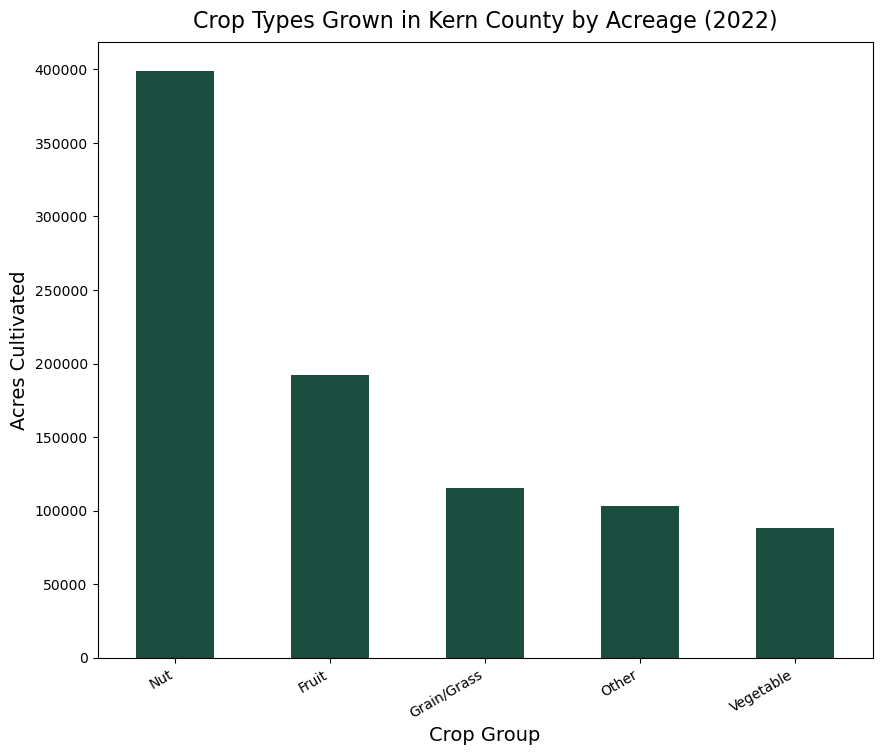

In [34]:
## creating chart to visualize table results
fig, ax = plt.subplots(figsize=(10,8))
grouparea.plot.bar(ax=ax,
                   x='Group',
                   y='Acreage',
                   legend=False,
                   color='#1b4d3e')

ax.set_xlabel('Crop Group',fontsize=14)
ax.set_ylabel('Acres Cultivated',fontsize=14)
ax.set_title("Crop Types Grown in Kern County by Acreage (2022)",fontsize=16,pad=10)
plt.xticks(rotation=30,ha='right')

## saving chart
# plt.savefig("KernCropTypesbyArea.jpg",bbox_inches='tight') ## stops python from cropping exported image

With this chart, it's easy to tell that croplands cultivated for "nuts" -- the most water intensive of the crops grown -- make up about half of all agricultural land in the county. Now to map the distribution of crop types. I'll need to use the merged oil well and CalEnviroScreen data (the merge being completed in NOTEBOOK C) for census tract boundaries.

In [35]:
## loading oil wells and CalEnvironscreen data
oilenv = gpd.read_file('OilCES4.geojson')

In [36]:
crops2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 12178 entries, 0 to 12177
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   Owner     12178 non-null  object  
 1   Crop      12178 non-null  object  
 2   Acres     12178 non-null  float64 
 3   City      12178 non-null  object  
 4   geometry  12178 non-null  geometry
 5   Group     12178 non-null  object  
dtypes: float64(1), geometry(1), object(4)
memory usage: 666.0+ KB


In [37]:
## checking projection
print(crops2.crs)
print(oilenv.crs)

epsg:2229
epsg:3857


In [38]:
## changing projection: prep for folium
crops2 = crops2.to_crs("EPSG:4326")
oilenv = oilenv.to_crs("EPSG:4326")

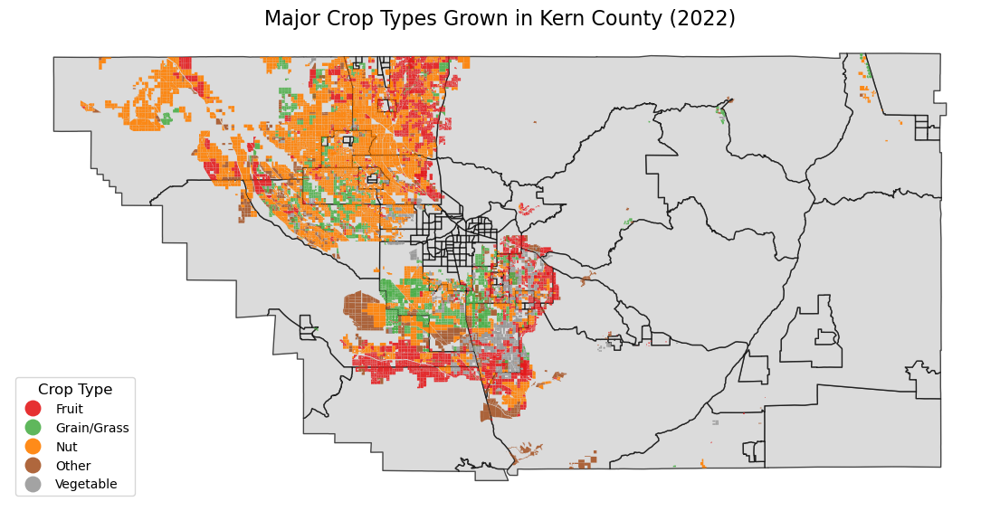

In [39]:
## map with census tract border overlays
fig, ax=plt.subplots(figsize=(14,12))

oilenv.plot(ax=ax,facecolor='#ccc',edgecolor='black',lw=1,alpha=.7)

crops2.plot(ax=ax,
                    column='Group',
                    legend=True,
                    cmap='Set1',
                    legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'medium'},
                    alpha=.9)

ax.axis('off')
ax.set_title("Major Crop Types Grown in Kern County (2022)",fontsize=16)
ax.get_legend().set_title("Crop Type")

This is much better visually to get a sense of what's being grown where. The original map had 182 different crop types (and an unwieldy legend to match). Now we can see that most of the croplands cultivated for nuts are in the northwest, while grains/grasses and vegetables are cultivated in the southwest. There's also a section of fruit cropland that seems to be grown in the census tract that has almost half of all the oil wells in Kern County located on it (visualized in NOTEBOOK C; visualized again later in the interactive map in this notebook). Yikes.

Now to overlay the oil well locations. But first, I'll have to pull and sort the raw well data (which is a large dataset) for the necessary locations.

In [40]:
## Pulling raw Kern County oil well data from group repo
kern_wells = pd.read_csv('https://raw.githubusercontent.com/ybecerra29/up221groupproject/main/kern_county_oil.csv')

In [41]:
## Examining well type
kern_wells['WellType'].value_counts()

OG       103604
SC        20070
SF        11508
WF         6996
OB         4228
DH         3481
Multi      2046
WD         1602
INJ         929
CH          611
DG          477
UNK         288
WS          141
PM          125
GD          115
AI           64
GAS          18
GS            9
LG            1
Name: WellType, dtype: int64

Based on this [CA Dept of Conservation (DOC) metadata doc](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), I'm limiting the Well Type included to OG (Oil and Gas) since the number of other relevant well types (GAS (Gas Well), LG (Liquid Gas), and DG (Dry Gas)) are so small in comparison.

In [42]:
## Examining the status of the wells in the County
kern_wells['WellStatus'].value_counts()

Plugged        71548
Active         46049
Idle           27930
Canceled        8355
New             2251
PluggedOnly      147
Unknown           33
Name: WellStatus, dtype: int64

Again, after consulting the [DOC metadata doc](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), I am cropping the "Canceled" wells. All other types, even the "Idle" wells have been drilled and or are capable of operations. Since we don't have time series data on oil wells, the safest thing is to assume that regardless of whether they are active as of this year, their presence alone and previous activities have probably had some kind of cumulative impact on health in some way in the County.

In [43]:
## Subsetting data for Oil and Gas wells
kern_OGwells = kern_wells[kern_wells['WellType'] == 'OG']
kern_OGwells.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103604 entries, 0 to 156312
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   LeaseName   103604 non-null  object 
 1   WellDesign  103604 non-null  object 
 2   WellStatus  103604 non-null  object 
 3   WellType    103604 non-null  object 
 4   WellTypeLa  103604 non-null  object 
 5   OperatorNa  103604 non-null  object 
 6   Place       103604 non-null  object 
 7   CountyName  103604 non-null  object 
 8   Latitude    103604 non-null  float64
 9   Longitude   103604 non-null  float64
 10  GISSource   103604 non-null  object 
 11  isDirectio  103604 non-null  object 
 12  WellSymbol  103604 non-null  object 
dtypes: float64(2), object(11)
memory usage: 11.1+ MB


In [44]:
## Dropping "Canceled" wells from dataset
kern_OGwells = kern_OGwells[kern_OGwells.WellStatus != 'Canceled']

Trimming the columns down to only what I need.

In [45]:
kern_OGwells.columns.to_list()

['LeaseName',
 'WellDesign',
 'WellStatus',
 'WellType',
 'WellTypeLa',
 'OperatorNa',
 'Place',
 'CountyName',
 'Latitude',
 'Longitude',
 'GISSource',
 'isDirectio',
 'WellSymbol']

In [46]:
## Trimming columns
kern_OGwells = kern_OGwells[['OperatorNa', 'WellStatus','WellType','Latitude','Longitude']]
kern_OGwells.sample()

,OperatorNa,WellStatus,WellType,Latitude,Longitude
7107,Aera Energy LLC,Plugged,OG,35.524197,-119.77021


In [47]:
## Renaming columns
kern_OGwells.columns = ['Operator', 'WellStatus','WellType','Latitude','Longitude']
kern_OGwells.sample()

,Operator,WellStatus,WellType,Latitude,Longitude
136958,Aera Energy LLC,Plugged,OG,35.158764,-119.530334


In [48]:
## status of the remaining wells in the data
kern_OGwells['WellStatus'].value_counts()

Plugged        55058
Active         23491
Idle           16718
New             1337
PluggedOnly      102
Unknown           21
Name: WellStatus, dtype: int64

Imporant to note -- there seem to be more "Plugged" than "Active" wells -- which, according to the [DOC](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), "represents plugged and abandoned wells that are permanently sealed."

Now to convert data into geodata for a map.

In [49]:
## converting df into gdf
kern_wellsgeo = gpd.GeoDataFrame(kern_OGwells, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(kern_OGwells.Longitude, kern_OGwells.Latitude))

Before overlaying the oil well locations onto the cropland map, I want to look at how oil wells are distributed by status in the County.

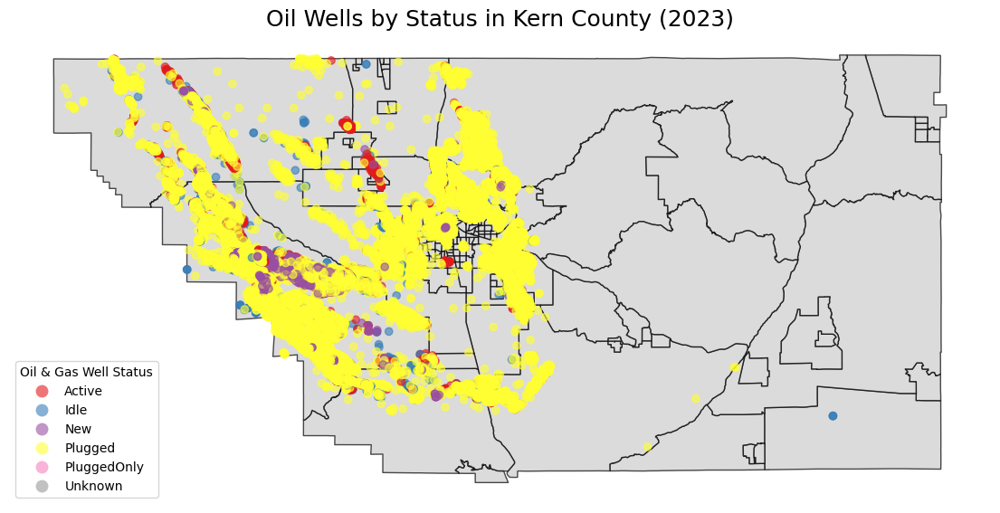

In [50]:
## static map: oil well locations by status
fig, ax = plt.subplots(figsize=(14,12))

# census tracts
oilenv.plot(ax=ax,facecolor='#ccc',edgecolor='black',lw=1,alpha=.7)

# wells
kern_wellsgeo.plot(ax=ax,
                   column='WellStatus',
                   legend=True,cmap='Set1',
                   legend_kwds={'loc': 'lower left'},
                   alpha=.6)

ax.axis('off')
ax.set_title('Oil Wells by Status in Kern County (2023)',fontsize=18)
ax.get_legend().set_title("Oil & Gas Well Status")

This map shows that most of the wells are plugged, but they seem to be obscuring the "Active" wells. Now to overlay oil wells by status onto the cropland data (without distinction between crop types, since that would just be too much data on one map).

Text(0.5, 1.0, 'Locations of Oil and Gas Wells (by Status) and Cropland in Kern County (2022)')

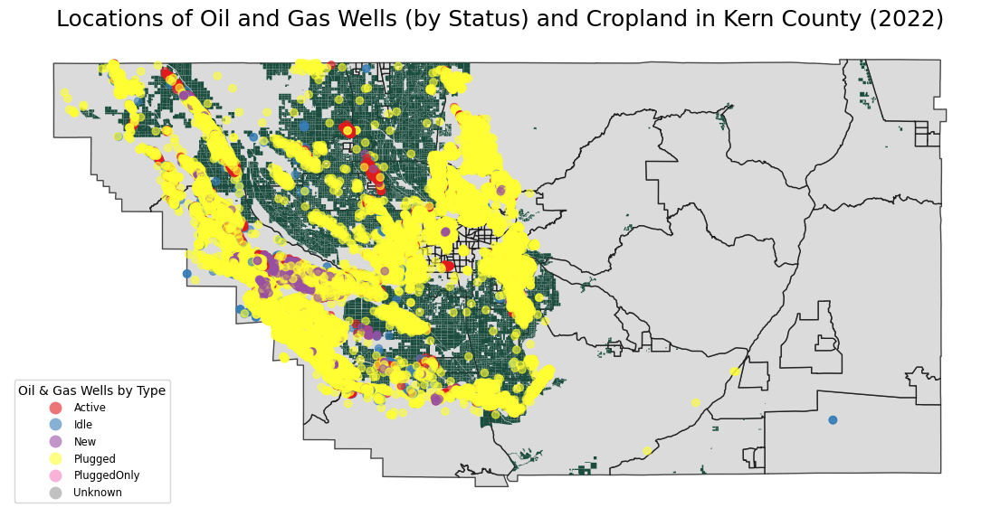

In [51]:
## Adding oil well locations by status to cropland on the map
fig, ax = plt.subplots(figsize=(14,12))

# census tract
oilenv.plot(ax=ax,facecolor='#ccc',edgecolor='black',lw=1,alpha=.7)

## crops
crops2.plot(ax=ax, 
       marker='.',
       markersize=6,
       color='#1b4d3e')

## OG wells layer
kern_wellsgeo.plot(ax=ax,
                               column='WellStatus',
                               legend=True,
                               legend_kwds={'loc':'lower left',
                        'bbox_to_anchor':(0, 0), 
                        'markerscale':1, 
                        'title_fontsize':'medium', 
                        'fontsize':'small'},
                               cmap='Set1', 
                               alpha=.6)

ax.axis('off')
ax.get_legend().set_title("Oil & Gas Wells by Type")
ax.set_title('Locations of Oil and Gas Wells (by Status) and Cropland in Kern County (2022)',fontsize=18,pad=10)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)
# plt.savefig("Kern_Crops_and_OGwellsall.jpg")

It's easy to see that oil wells and cropland are concentrated near each other -- which makes a lot of sense since (as we'll see later) a lot of major waterways and water infrastructure (mostly canals) are located in this area, and farmers and oil and gas operators need water to irrigate croplands and to extract oil and gas from the ground. Naturally, they'd locate where all the water is found.

But it's difficult to see where the "Active" wells are on both these map. Both these map shows all 90,000+ oil and gas wells that are not "cancelled" (which were dropped from the original dataset). Most of them are "idle", and only ~20,000 are "active". This might be a good opportunity to create maps that allow us to see the proximity of well type to the different crop types. (Hello, loops).

In [52]:
## showing each type of well individually overlaid onto the crop types

# creating well status type list
status = kern_wellsgeo['WellStatus'].unique().tolist()
status

['Idle', 'Active', 'Plugged', 'New', 'PluggedOnly', 'Unknown']

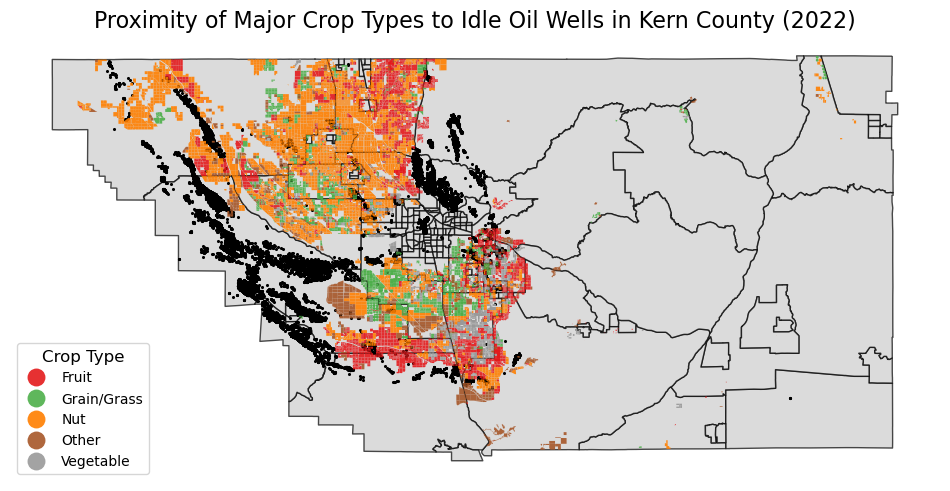

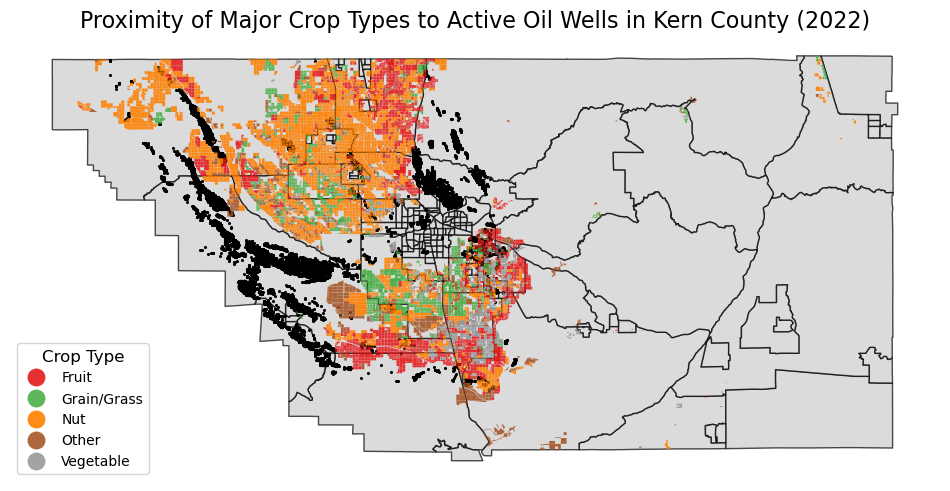

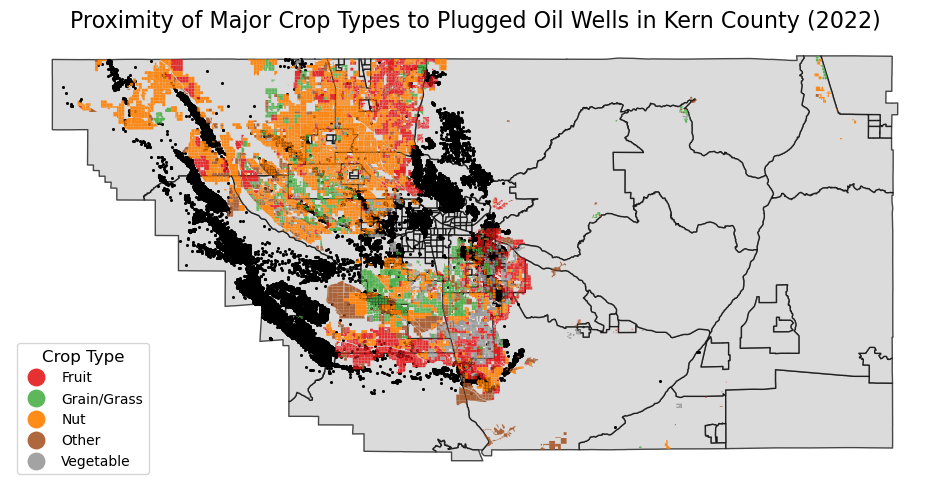

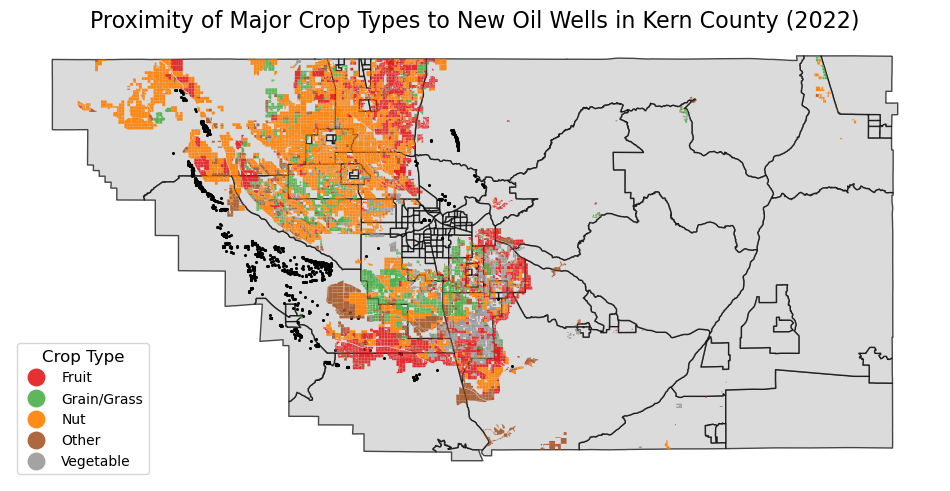

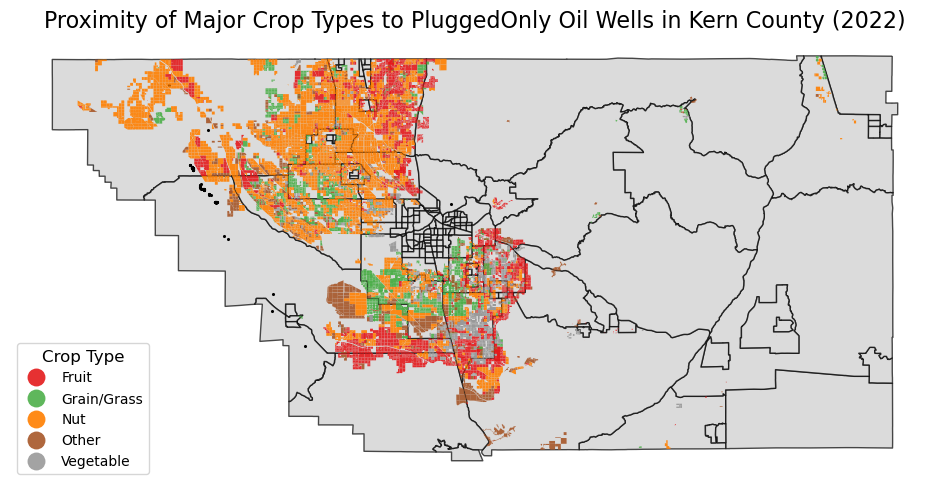

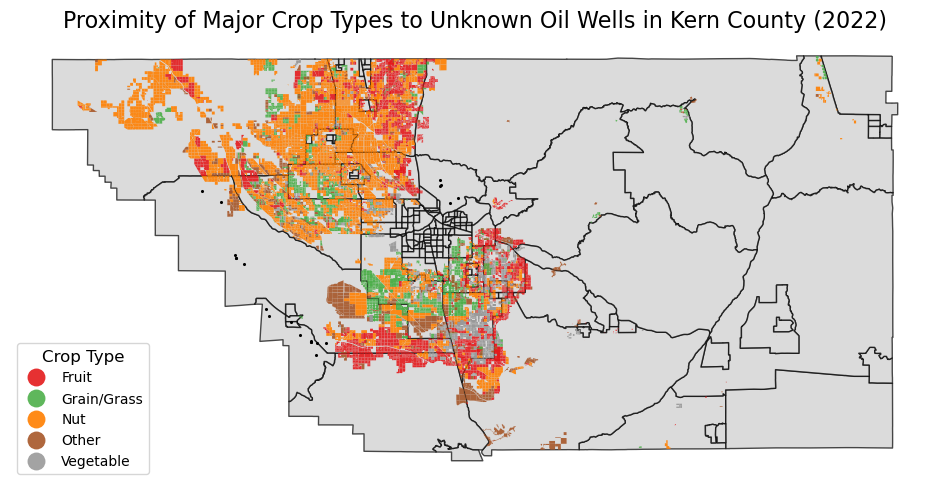

In [53]:
# loop
for type in status:
    fig, ax=plt.subplots(figsize=(12,10))

    # census tract borders
    oilenv.plot(ax=ax,facecolor='#ccc',edgecolor='black',lw=1,alpha=.7)

    # oil wells: specified by type
    kern_wellsgeo[kern_wellsgeo['WellStatus'] == type].plot(ax=ax,
           marker='.',
           markersize=6,
           color='black')

    # crops
    crops2.plot(ax=ax,
                    column='Group',
                    legend=True,
                    cmap='Set1',
                    legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'medium'},
                    alpha=.9)

    ax.axis('off')
    ax.set_title("Proximity of Major Crop Types to"+ ' '+ type + ' ' +"Oil Wells in Kern County (2022)",fontsize=16)
    ax.get_legend().set_title("Crop Type")

It's hard to tell at this scale, but all the wells are clustered in the same locations/patterns for the most part, so all the cropland -- no matter the crop -- seems to be equally exposed to each type of well by status.

But I also wanted to see how the different crop types compare in their proximity to only the "Active" wells.

In [54]:
## showing each crop type individually overlaid onto "active" wells

# creating crop type list
ctype = crops2['Group'].unique().tolist()
ctype

['Other', 'Nut', 'Fruit', 'Grain/Grass', 'Vegetable']

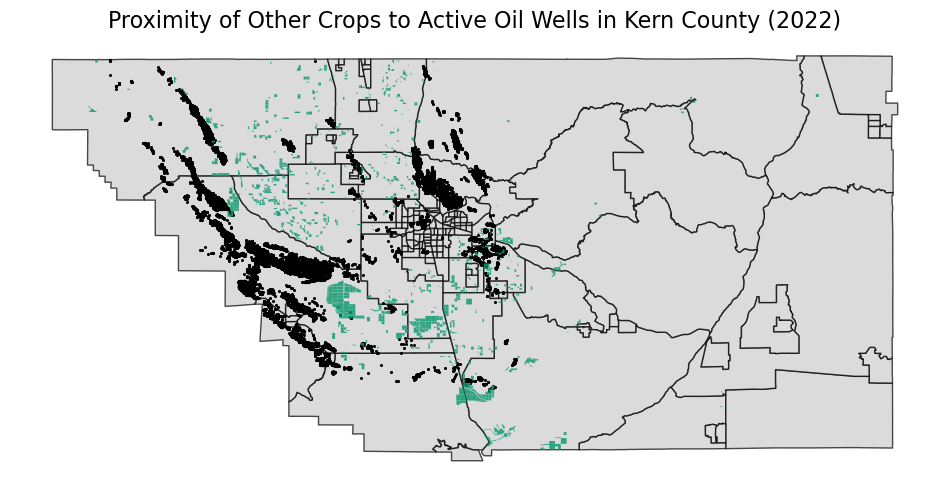

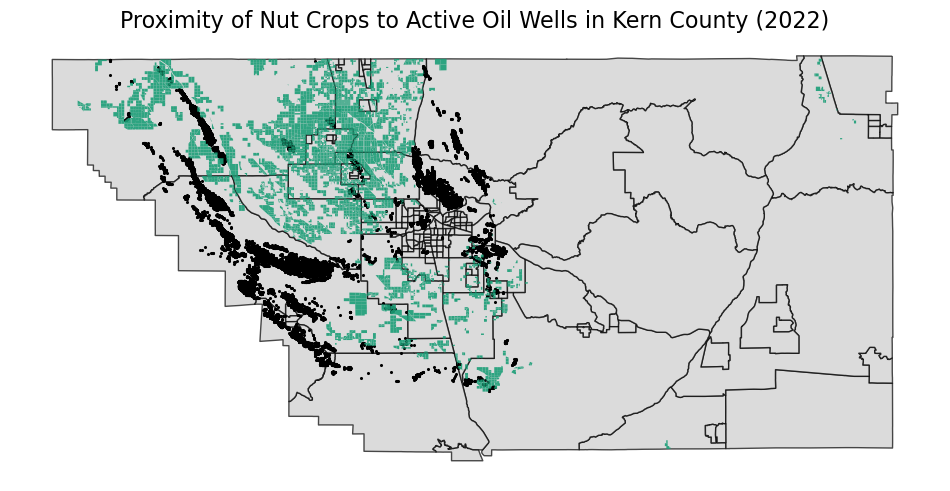

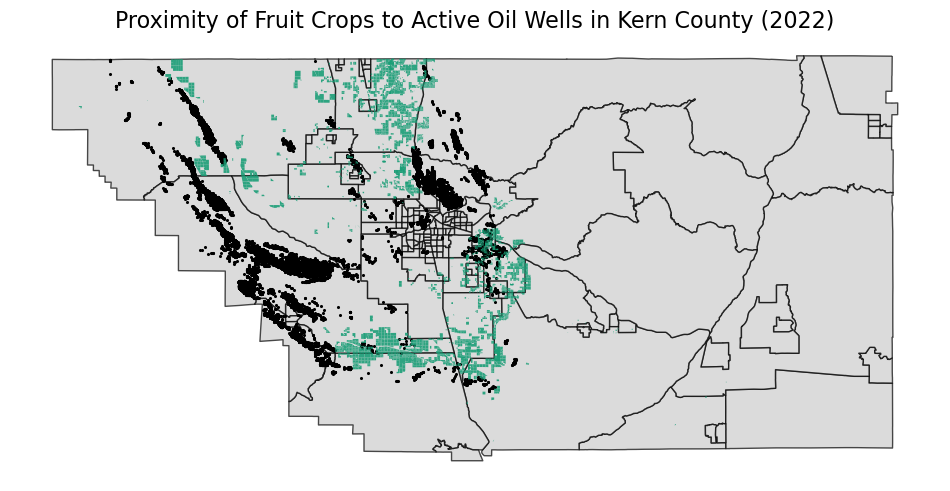

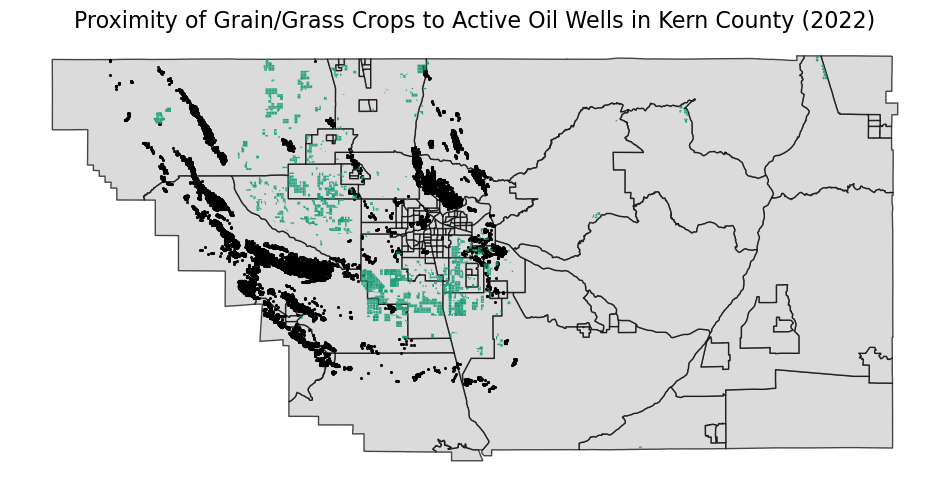

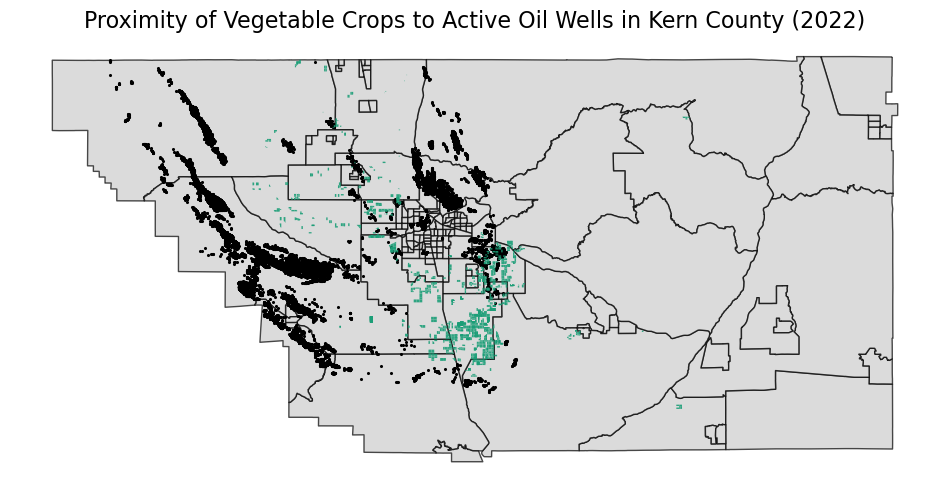

In [55]:
# loop
for type in ctype:
    fig, ax=plt.subplots(figsize=(12,10))

    # census tract borders
    oilenv.plot(ax=ax,facecolor='#ccc',edgecolor='black',lw=1,alpha=.7)

    # oil wells: specified by type
    kern_wellsgeo[kern_wellsgeo['WellStatus'] == 'Active'].plot(ax=ax,
           marker='.',
           markersize=6,
           color='black')

    # crops
    crops2[crops2['Group'] == type].plot(ax=ax,
                    column='Group',
                    legend=False,
                    cmap='Dark2',
                    alpha=.9)

    ax.axis('off')
    ax.set_title("Proximity of"+' '+ type + ' '+ "Crops to Active Oil Wells in Kern County (2022)",fontsize=16)

## Looking at the Relationship Between Oil and Gas Wells and Health Outcomes

The previous notebooks included maps exploring the individual demographic, health, and even oil well densities in specific census tracts in the County. Now to overlay these maps together in an interactive map to get a sense of how these outcomes relate to each other.

In [56]:
## adjusting projection of the geodataframe that will be used for the folium map
oilenv_mercator = oilenv.to_crs(3857)

In [57]:
## Creating "toggle-able" layers
Kern = folium.Map(location=[35.4,-118.8], 
               zoom_start = 8,
               tiles=None,
               overlay=False)

## FAILING to add a poor man's title, code works but image is not showing up properly
## from folium.plugins import FloatImage
## image_file ='Kern Map Title_small.png'
## FloatImage(image_file, bottom=86, left=10).add_to(Kern)

fg1 = folium.FeatureGroup(name='Density of Oil & Gas Well Locations',overlay=False).add_to(Kern)
fg2 = folium.FeatureGroup(name='Population Count',overlay=False).add_to(Kern)
fg3 = folium.FeatureGroup(name='Incidence of Low Birth Weight',overlay=False).add_to(Kern)
fg4 = folium.FeatureGroup(name='Asthma Rate per 10K residents',overlay=False).add_to(Kern)
fg5 = folium.FeatureGroup(name='Cardiovascular Disease Rate per 10K residents',overlay=False).add_to(Kern)
fg6 = folium.FeatureGroup(name='Pesticide Use (lb. per square mile)',overlay=False).add_to(Kern)

In [58]:
## adding OG wells layer
custom_scale1 = (oilenv_mercator['Count'].quantile((0,0.3,0.75,0.95,0.999,1))).tolist()
OGwells=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS', 'Count'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale1,
            fill_color='YlOrRd',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Oil & Gas Well Density',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg1)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Oil & Gas Well Locations in Kern County (2023)',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Count'
                               ],
                        aliases=["Tract:",
                                 "Oil & Gas Wells:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(OGwells) 

In [60]:
## adding Population layer
custom_scale2 = (oilenv_mercator['TotPop19'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Population=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','TotPop19'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale2,
            fill_color='Blues',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Population Count',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg2)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Number of Residents by Census Tract in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'TotPop19',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Residents:",
                                 "City/Area:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Population) 

In [61]:
## low birthweight layer
custom_scale3 = (oilenv_mercator['LowBirtWt'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Lowbirthweight=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','LowBirtWt'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale3,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Population Count',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg3)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Incidence of Low Birth Weight in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'LowBirtWt'
                               ],
                        aliases=["Tract:",
                                 "Percentage of Births:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Lowbirthweight) 

In [62]:
## Asthma layer
custom_scale4 = (oilenv_mercator['Asthma'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Asthma=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','Asthma'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale4,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Rates of Asthma',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg4)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Rates of Asthma per 10,000 residents in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Asthma'
                               ],
                        aliases=["Tract:",
                                 "Asthma Rate:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Asthma) 

In [63]:
## Cardio disease layer
custom_scale5 = (oilenv_mercator['Cardiovas'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Cardio=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','Cardiovas'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale5,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Rates of Cardiovascular Disease',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg5)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Rates of Cardiovascular Disease per 10,000 residents in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Cardiovas'
                               ],
                        aliases=["Tract:",
                                 "Cardiovascular Disease Rate:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Cardio) 

In [64]:
## Pesticide layer
custom_scale6 = (oilenv_mercator['Pesticide'].quantile((0,0.5,0.75,0.85,0.95,1))).tolist()
Pesticide=folium.Choropleth(
            geo_data=oilenv_mercator,
            data=oilenv_mercator,
            columns=['FIPS','Pesticide'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale6,
            fill_color='Reds',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Rates of Cardiovascular Disease',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg6)

## Adding tooltips
folium.features.GeoJson(
                    data=oilenv_mercator,
                    name='Pesticide Use (lb./square mile) in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Pesticide'
                               ],
                        aliases=["Tract:",
                                 "Pound/square mile:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Pesticide) 

In [65]:
## Adding layer control
# folium.TileLayer('Stamen Toner',overlay=True).add_to(Kern)
folium.TileLayer('cartodbpositron',overlay=True).add_to(Kern)
folium.LayerControl(collapsed=True).add_to(Kern)
Kern

Now that we have all the indicator layered together, we can see that oil well density (and pesticide use detected) does not correspond directly to health outcomes in specfic census tracts. This is likely because (1) with the exception of the cities of the metro center (e.g. Bakersfield), people seem to be concentrated in the eastern portion of the County (e.g. California City), and (2) it's possible that health outcomes might also be related to how the County's waterways and water infrastructure might be distributing water, and as a result the waste from oil and agriculture activities, throughout the County.

## Mapping Waterways and Water Infrasctructure in Kern County

Let's first start by actually looking at where cities have been established in the County, and the relationship to the canals in the County. It might be informative to compare with the "Population" layer in the folium map.

In [66]:
## loading city limits
city = gpd.read_file('City_Limits.shp')

In [67]:
## loading canals data
canals = gpd.read_file('Canals_Kern_24k.shp')

In [68]:
## inspecting
city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 39 entries, 0 to 38
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   Munici_ID  39 non-null     object  
 1   Label      17 non-null     object  
 2   geometry   39 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 1.0+ KB


In [69]:
## inspecting
canals.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   FNODE_      64 non-null     int64   
 1   TNODE_      64 non-null     int64   
 2   LPOLY_      64 non-null     int64   
 3   RPOLY_      64 non-null     int64   
 4   LENGTH      64 non-null     float64 
 5   CANAL24CA_  64 non-null     int64   
 6   CANAL24CA1  64 non-null     int64   
 7   CANAL       53 non-null     object  
 8   FED         64 non-null     int64   
 9   STATE       64 non-null     int64   
 10  geometry    64 non-null     geometry
dtypes: float64(1), geometry(1), int64(8), object(1)
memory usage: 5.6+ KB


In [70]:
## checking projection
print(city.crs)
print(canals.crs)

epsg:2229
epsg:2229


In [71]:
## adjusting projection
city = city.to_crs("EPSG:4326")
canals = canals.to_crs("EPSG:4326")

In [72]:
city.sample(3)

,Munici_ID,Label,geometry
21,ISLAND,None,"POLYGON ((-119.12804 35.42937, -119.12788 35.4..."
30,ISLAND,None,"POLYGON ((-118.98099 35.31408, -118.98098 35.3..."
17,ISLAND,None,"POLYGON ((-119.00337 35.31889, -119.00337 35.3..."


What cities are included in this data?

In [73]:
## inspecting muni ID
city['Munici_ID'].to_list()

['CITY OF WASCO',
 'CITY OF MARICOPA',
 'CITY OF TEHACHAPI',
 'CITY OF ARVIN',
 'CITY OF CALIFORNIA CITY',
 'CITY OF DELANO',
 'CITY OF DELANO',
 'CITY OF DELANO',
 'CITY OF SHAFTER',
 'CITY OF SHAFTER',
 'CITY OF SHAFTER',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'ISLAND',
 'CITY OF TAFT',
 'ISLAND',
 'ISLAND',
 'CITY OF TEHACHAPI',
 'ISLAND',
 'CITY OF BAKERSFIELD',
 'ISLAND',
 'ISLAND',
 'CITY OF MCFARLAND',
 'ISLAND',
 'CITY OF RIDGECREST',
 'ISLAND',
 'CITY OF BAKERSFIELD']

Now to map the cities.

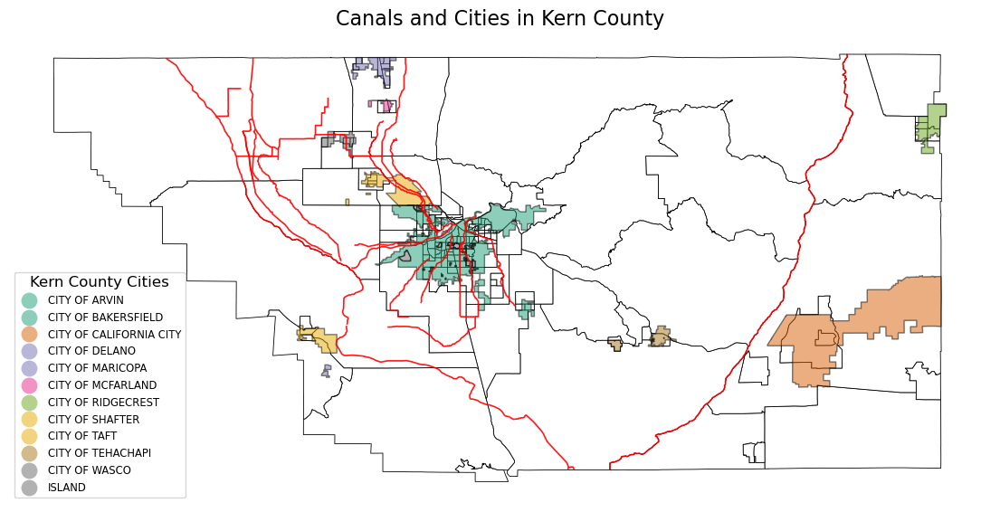

In [74]:
## cities map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)
# cities
city.plot(ax=ax,
                   column='Munici_ID',
                   legend=True,
                   legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
                   cmap='Dark2',
                   edgecolor='black',
                   lw=1,
                   alpha=0.5)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.2,
            color='red',
            alpha=0.9)

ax.axis('off')
ax.set_title("Canals and Cities in Kern County",fontsize=16)
ax.get_legend().set_title("Kern County Cities")

It's helpful to see where all the cities are -- so much of the County is unincorporated. 

I'm not really sure what "Island" corresponds to -- could it be related to the [Kern Island Canal](https://meyerce.net/kern-island-canal)? (It seems to be located in Bakersfield, and when the cities were remapped to include only the locations named "Island", they were all concentrated near the Bakersfield area.)

It looks like most of the canals are in the western portion of the county where all the major cities and cropland and oil and gas wells are concentrated.

Now, we can begin exploring where all the other waterways and water infrastructure in the County are -- in hopes that it might begin to help explain some of the counterintuitive findings in the interactive map.

In [76]:
## loading files for other waterways and infrastructure

# water infrastructure (includes more comprehensive data than "canals")
watercourse = gpd.read_file('berkeley-s74962-geojson.json')

# water districts gdf
district = gpd.read_file('bc32bbfe-e884-453e-bf58-50fb769850de2020410-1-z3vpjg.shp')

# watershed gdf
watershed = gpd.read_file('EPA_Surf_Your_Watershed_[ds732].geojson')

In [77]:
## checking projections
print(watercourse.crs)
print(district.crs)
print(watershed.crs)

epsg:4326
epsg:4326
epsg:4326


In [78]:
## adjusting projections
watercourse = watercourse.to_crs("EPSG:4326")
district = district.to_crs("EPSG:4326")
watershed = watershed.to_crs("EPSG:4326")

Mapping water districts and canals to see what it might tell us about the movement of water to and from different parts of the county.

Text(0.5, 1.0, 'Water Districts and Canals in Kern County')

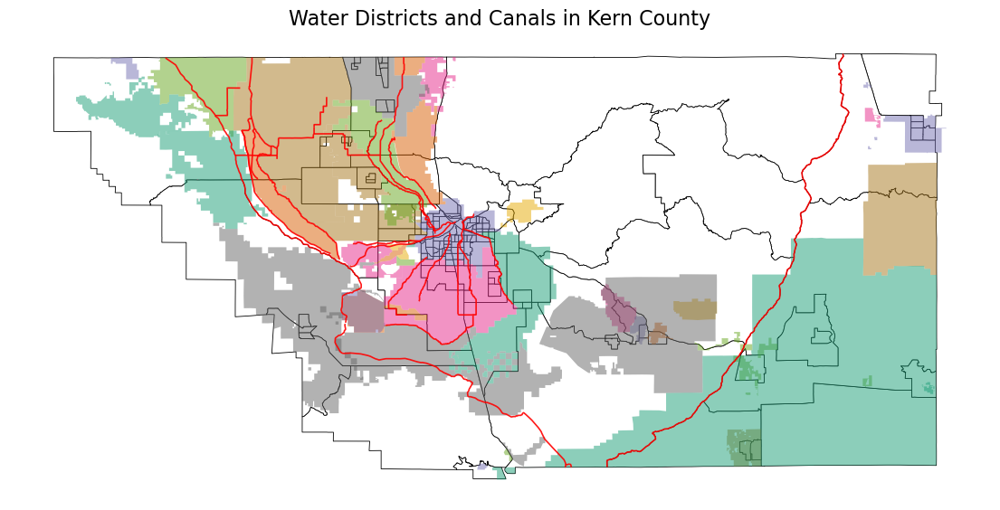

In [79]:
## overlaying districts onto map

fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1.2,
            color='red',
            alpha=0.9)
# water districts
district.plot(ax=ax,
              column='WDNAME',
              cmap='Dark2',
              alpha=0.5,
              legend=False) # too many districts; will interfere with map visibility

ax.axis('off')
ax.set_title("Water Districts and Canals in Kern County",fontsize=16)

It looks like most of the individual water districts are also concentrated in the west -- though a few of them seem to be larger and have service areas that geographic spread from east to western part of the County where most of the oil wells and cropland are concentrated. This information might be useful later on after we've done more research to get a sense of how the water districts provide/deliver water to the different parts of the county (e.g. what directions the waterflows go in and what water infrastructure they utilize).

Now to map the watersheds. But before the watershed data can be mapped, it needs to be clipped to include only the watersheds in Kern County, since, as it is, it includes data for all CA watersheds.

In [80]:
## clipping state watershed boundaries using Kern County boundaries
kernwatershed = gpd.clip(watershed, oilenv)

/opt/conda/lib/python3.10/site-packages/geopandas/tools/clip.py:67: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


In [81]:
## checking results
print(watershed.shape)
print(kernwatershed.shape)

(165, 7)
(15, 7)


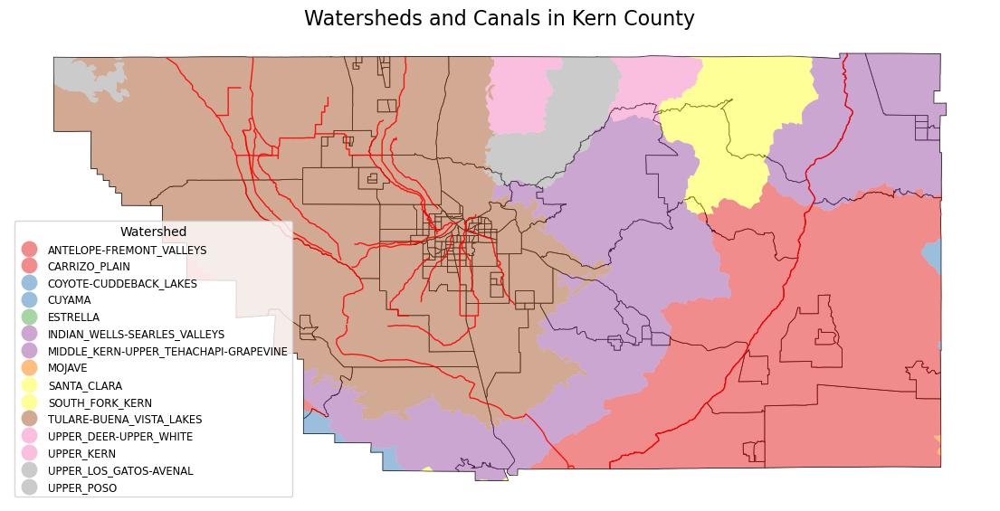

In [82]:
## overlaying watersheds onto map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1,
            color='red',
            alpha=0.9)
# watersheds
kernwatershed.plot(ax=ax,
                   column='CUNAME',
                   legend=True,
                   legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'medium', 
                                 'fontsize':'small'},
                   cmap='Set1',
                   alpha=0.5)

ax.axis('off')
ax.set_title("Watersheds and Canals in Kern County",fontsize=16)
ax.get_legend().set_title("Watershed")

Based on the previous maps, it looks one watershed, the Tulare-Buena Vista Lakes Watershed, is where all the oil and gas well and agricultural activity is concentrated. This watershed also houses the most of the canals deliverying water to and from the different watersheds and the state water projects to irrigate cropland and to support oil and gas well operations. 

Let's overlay (1) the oil well data and (2) cropland data just to get a spatial sense of this relationship. 

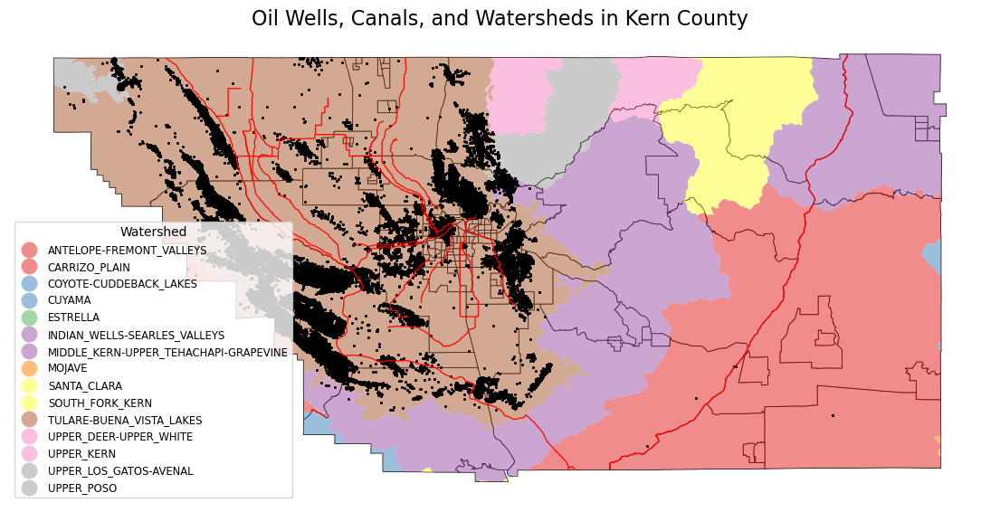

In [83]:
## overlaying oil wells onto map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1,
            color='red',
            alpha=0.9)
# watersheds
kernwatershed.plot(ax=ax,
                   column='CUNAME',
                   legend=True,
                   legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'medium', 
                                 'fontsize':'small'},
                   cmap='Set1',
                   alpha=0.5)
# OG wells
kern_wellsgeo.plot(ax=ax,
               marker='.',
               markersize=6,
               color='black')

ax.axis('off')
ax.set_title("Oil Wells, Canals, and Watersheds in Kern County",fontsize=16)
ax.get_legend().set_title("Watershed")

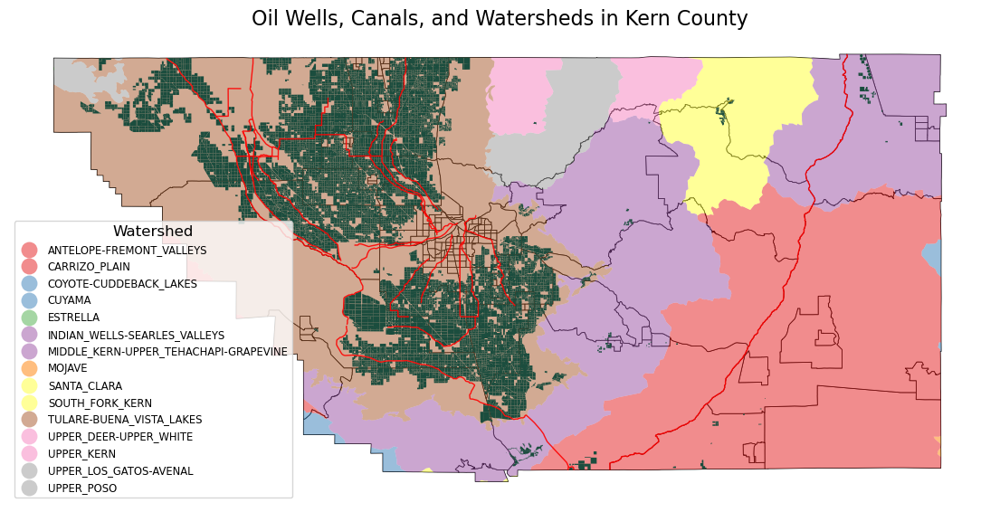

In [84]:
## overlaying cropland onto map
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='black',
            lw=0.6)
# watersheds
kernwatershed.plot(ax=ax,
                   column='CUNAME',
                   legend=True,
                   legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
                   cmap='Set1',
                   alpha=0.5)
# crops
crops2.plot(ax=ax,
               marker='o',
               markersize=4,
               color='#1b4d3e')
# canals
canals.plot(ax=ax,
            linestyle='solid',
            linewidth=1,
            color='red',
            alpha=0.9)

ax.axis('off')
ax.set_title("Oil Wells, Canals, and Watersheds in Kern County",fontsize=16)
ax.get_legend().set_title("Watershed")

As expected, almost all oil and gas wells and cropland are contained within the Tulare-Buena Vista Lakes Watershed. To get a better sense of how the waste from the oil well and agricultural activities in this watershed might be distributed to/impact the other areas of the county, we'll need more data about other types of infrastructure that deliver water to and from different areas of the county, the direction of the water delivery/travel flows, and to get a better sense of how the different water districts provide service to both the cities and unincorporated areas of the County. 

The "watercourse" data is really difficult to map. No matter what adjustments I make to the map (e.g. setting line size to 100), the lines are so faint, they're barely visible. But they might contain useful data about the few other other types of water infrastructure in the County (like the state water projects). It might be helpful to render this data in table form, since it's not helpful when mapped.

Let's try to get a sense of the different types of water infrastructure in the county and how many of these structures are below versus above ground level.

In [85]:
## different types of water infrastructure in the County
watercoursetype = watercourse.value_counts(['TYPE']).reset_index(name="Count")
watercoursetype

,TYPE,Count
0,canal,101
1,river,3
2,aqueduct,2
3,spillway,1
4,turnout,1


Seems like the most common water infrastructure is canals -- which makes sense since there's only a few rivers in the county. The aqueducts likely refer to the California Aqueduct and the Los Angeles Aqueduct, which both are located in the the county (LA running down the eastern side, CA running down the western portion, right through the cluster of cropland and oil wells).

In [86]:
## replacing values for "BURIED" column
watercourse['BURIED'] = watercourse['BURIED'].replace(['Y'], 'Below Ground')
watercourse['BURIED'] = watercourse['BURIED'].replace(['N'], 'Above Ground')
watercourse.sample()

,id,NAME,TYPE,BURIED,geometry
100,s74962.101,Beardsley Canal,canal,Below Ground,"MULTIPOLYGON (((-118.97777 35.41789, -118.9777..."


In [87]:
## above versus below ground water infrastructure
buried = watercourse.value_counts(['BURIED']).reset_index(name="Count")
buried

,BURIED,Count
0,Above Ground,61
1,Below Ground,47


Just over half of the water infrastructure is above ground.

I want to create a chart that identifies type of waterstructures based on whether it is above or below ground. But I have to combine these two tables into one table before I can do that. I haven't figured out how to do that yet, but think knowing the raw outputs would still be useful as we look further into the role waterways and infrastructure play in distributing the waste from oil and gas (and agricuktural) production to other areas of the County.

In [88]:
# creating dataframe with just the columns I want
watercoursedistr = watercourse[['TYPE','BURIED']]

# summing water course type by buried or not
watercoursedistr = watercoursedistr.groupby(['TYPE','BURIED'])['TYPE'].aggregate('count')
watercoursedistr

TYPE      BURIED      
aqueduct  Above Ground     2
canal     Above Ground    55
          Below Ground    46
river     Above Ground     3
spillway  Above Ground     1
turnout   Below Ground     1
Name: TYPE, dtype: int64

Half of the canals are above ground, while the other half are below ground.

How does this compare with the information provided in the canals geodataframe?

In [89]:
## inspecting
canals.sample(2)

,FNODE_,TNODE_,LPOLY_,RPOLY_,LENGTH,CANAL24CA_,CANAL24CA1,CANAL,FED,STATE,geometry
41,0,0,0,0,8489.160156,176,7460,EAST SIDE CANAL,0,0,"LINESTRING (-119.40379 35.37496, -119.39945 35..."
40,0,0,0,0,30730.900391,175,7379,EAST SIDE CANAL,0,0,"LINESTRING (-119.60106 35.55677, -119.60117 35..."


In [90]:
## number of canals in the dataset
canals['CANAL'].value_counts()

LOS ANGELES AQUEDUCT              8
CALIFORNIA AQUEDUCT               7
EAST SIDE CANAL                   6
CALLOWAY CANAL                    6
GOOSE LAKE CANAL                  5
KERN ISLAND CANAL                 2
POND-POSO CANAL                   2
WEST SIDE CANAL                   2
KERN RIVER FLOOD CANAL            2
CROSS VALLEY CANAL                1
W BRANCH CALIFORNIA AQUEDUCT      1
SHAFTER WASCO ID LATERAL          1
STINE CANAL                       1
NEW RIM DITCH                     1
MAIN CANAL-NORTH REACH            1
BUENA VISTA CANAL                 1
KERN ISLAND CANAL(CNTRL BRNCH)    1
LERDO CANAL                       1
PIONEER CANAL                     1
MAIN DRAIN                        1
FRIANT-KERN CANAL                 1
KERN ISLAND DRAIN                 1
Name: CANAL, dtype: int64

Since the polygons/lines in the "watercourse" geodataframe won't show up in a map, I'll try mapping "canals" for the individual canals.

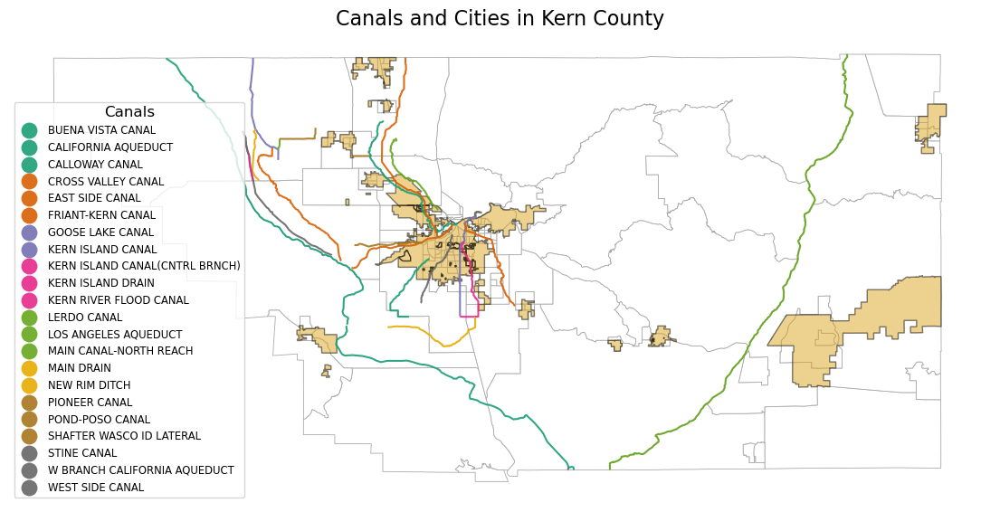

In [104]:
## mapping to see if this provides more information on the map than the "watercourse" gdf
fig,ax = plt.subplots(figsize=(14,12))

# tracts
oilenv.plot(ax=ax,
            facecolor='white',
            edgecolor='#aaa',
            lw=0.6)
# cities
city.plot(ax=ax,
                   facecolor='#daa520',
                   edgecolor='black',
                   lw=1,
                   alpha=0.5)
# canals
canals.plot(ax=ax,
            column='CANAL',
            cmap='Dark2',
            legend=True,
            legend_kwds={'loc':'lower left',
                                 'bbox_to_anchor':(0, 0), 'fmt':"{:.1f}",
                                 'markerscale':1.29, 
                                 'title_fontsize':'large', 
                                 'fontsize':'small'},
            linestyle='solid',
            linewidth=1.5,
            alpha=0.9)

ax.axis('off')
ax.set_title("Canals and Cities in Kern County",fontsize=16)
ax.get_legend().set_title("Canals")

This map is definitely not perfect, but does offer more information about which canals might be important to further research.

## Assignment Group Summary

**Group name**: Environmental Justice In Kern County

**Members**: Yesenia Becerra, Dinah Dominguez, Melody Ng, Nick Stewart-Bloch

**My Contributions**: I explored and mapped cropland data, oil and gas well data, and health outcome data, waterway and water infrastructure data (created tables, charts, static and interactive maps).